## citation
## Labeling https://www.youtube.com/watch?v=PPpKlPYL95c
## Labeling https://www.youtube.com/watch?v=AOosZVrTUbQ

## Point Cloud Collection: https://github.com/Waley-Z/ios-depth-point-cloud
## Intrinsic matrix mapping Lidar to 2D https://www.youtube.com/watch?v=nRVuLFQ_Bng
## https://www.youtube.com/watch?v=fVJeJMWZcq8

In [1]:
import open3d as o3d
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.graph_objects as go

In [2]:
pcd = o3d.io.read_point_cloud("2025-03-26_090624.ply")

In [3]:
xyz = np.asarray(pcd.points)

In [4]:
def getXyxFromPly(file_name):
    pcd = o3d.io.read_point_cloud(file_name)
    xyz = np.asarray(pcd.points)
    return xyz

In [5]:
def showImg(image_name):
    img = mpimg.imread(image_name)
    plt.imshow(img)  
    plt.axis('off')  
    plt.show()

In [6]:
print(xyz[:5])

[[-0.25044078 -0.0399094  -0.47564974]
 [-0.23697805 -0.04111805 -0.4897342 ]
 [-0.22720551 -0.04323376 -0.5148892 ]
 [-0.21873835 -0.04606386 -0.5487052 ]
 [-0.19613741 -0.04632502 -0.551034  ]]


In [7]:
print(len(xyz))

494


In [8]:
print(xyz[:400])

[[-0.25044078 -0.0399094  -0.47564974]
 [-0.23697805 -0.04111805 -0.4897342 ]
 [-0.22720551 -0.04323376 -0.5148892 ]
 ...
 [-0.04833301 -0.15175556 -0.16322882]
 [-0.03796085 -0.14995904 -0.16125311]
 [-0.0279691  -0.1489011  -0.1600725 ]]


In [9]:
print(xyz[:400])

[[-0.25044078 -0.0399094  -0.47564974]
 [-0.23697805 -0.04111805 -0.4897342 ]
 [-0.22720551 -0.04323376 -0.5148892 ]
 ...
 [-0.04833301 -0.15175556 -0.16322882]
 [-0.03796085 -0.14995904 -0.16125311]
 [-0.0279691  -0.1489011  -0.1600725 ]]


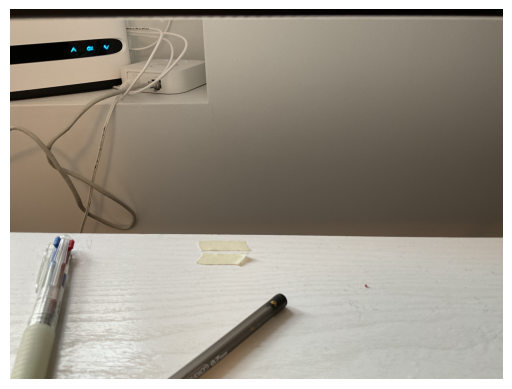

In [10]:
img = mpimg.imread('IMG_6216.jpg')  # Load image
plt.imshow(img)  
plt.axis('off')  
plt.show()

In [11]:
#scatter plot
def showPlotlyScatter(xyz):
    fig = go.Figure(data=[go.Scatter3d(
        x=xyz[:, 0], y=xyz[:, 1], z=xyz[:, 2],
        mode='markers',
        marker=dict(
            size=2,  
            color=xyz[:, 2],  
            colorscale='viridis',
            opacity=0.8
        )
    )])
    
    # fig.update_layout(scene=dict(
    #     xaxis_title="X",
    #     yaxis_title="Y",
    #     zaxis_title="Z"
    # ))
    
    fig.update_layout(scene=dict(
        xaxis=dict(title="X", range=[xyz[:, 0].max(), xyz[:, 0].min()]),  # Flip X
        yaxis=dict(title="Y", range=[xyz[:, 1].max(), xyz[:, 1].min()]),  # Flip Y
        zaxis=dict(title="Z")
    ))
    
    fig.show()

In [12]:
def showPltScatter(xyz):
    x = xyz[:, 0]  # X-coordinates
    y = xyz[:, 1]  # Y-coordinates
    z = xyz[:, 2]  # color
    
    # Create scatter plot
    plt.scatter(x, y, c=z, cmap='viridis')
    plt.colorbar(label='Z value')  # color legend
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("2D Scatter Plot with Z as Color")
    
    plt.show()


In [13]:
## Visualization ommited due to memory (as project became bigger)
## showPlotlyScatter(xyz)
## showPltScatter(xyz)

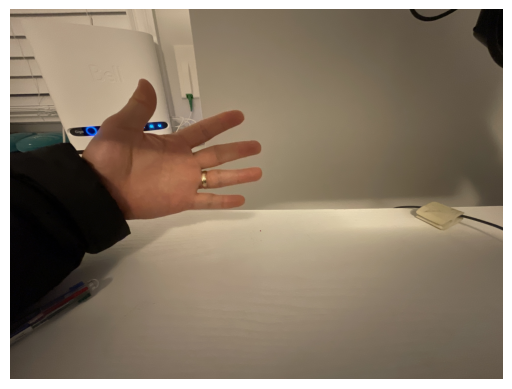

In [14]:
img = mpimg.imread('IMG_6219.jpg')
plt.imshow(img)
plt.axis('off')
plt.show()

In [15]:
pcd = o3d.io.read_point_cloud("2025-03-26_092011.ply")
xyz = np.asarray(pcd.points)
showPlotlyScatter(xyz)

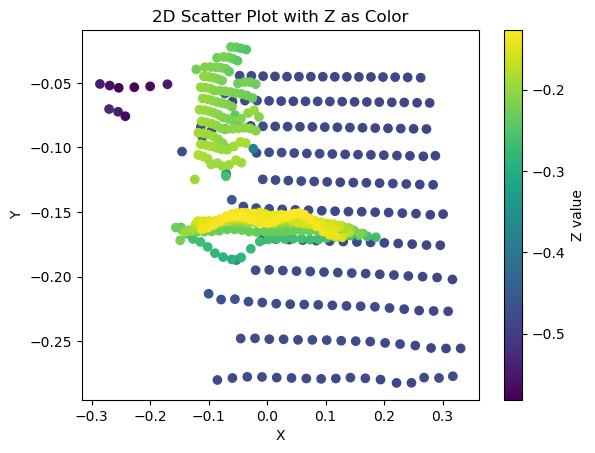

In [18]:
showPltScatter(xyz)

## The Lidar image is squashed if printed out in true x,y coordinate. 
## How about if I printed the x,y in a grid manner where each point is equi distance from each other?


In [19]:
import pandas as pd

In [20]:
# np.set_printoptions(threshold=np.inf)
pd.set_option('display.max_rows', None)

In [21]:
df = pd.DataFrame(xyz, columns=['X', 'Y', 'Z'])

In [22]:
df.iloc[:100]

,X,Y,Z
0,-0.286034,-0.050894,-0.548850
1,-0.269307,-0.052128,-0.562268
2,-0.253893,-0.053871,-0.581302
3,-0.227287,-0.053420,-0.576067
4,-0.200169,-0.052724,-0.568133
5,-0.170618,-0.051122,-0.550192
6,-0.061984,-0.022226,-0.230969
7,-0.052969,-0.022515,-0.234056
8,-0.044810,-0.023360,-0.243275
9,-0.035869,-0.024206,-0.252499


## Guess: Lidar shoots out a uniform number of points(lasers) as it is similar to a CMOS sensor.
#### this would mean that if the sensor has a fixed dimention (e.g. 100x by 100y)
#### Let's find out

## Seems like -x is left and x+ is right
## What if I iterate over and find out where the numbers flip from + -> -  
## Imagining I am a typewriter, that will tell me when the most right side of the image is over

In [23]:
count = 0
prev = -100
rowCounter = 1
for i, row in df.iterrows():
    count += 1
    curr = row.X
    if (curr < prev) and (prev > 0) and (curr < 0):
        print("Row Number", rowCounter)
        print(count)
        print(f"prev {prev} curr {curr}")        
        count = 0
        rowCounter += 1
    prev = row.X 

Row Number 1
27
prev 0.26256636 curr -0.2703802
Row Number 2
26
prev 0.27794233 curr -0.121240236
Row Number 3
26
prev 0.27238882 curr -0.108168446
Row Number 4
26
prev 0.28763798 curr -0.11356128
Row Number 5
26
prev 0.28384596 curr -0.11013995
Row Number 6
26
prev 0.3008527 curr -0.11564887
Row Number 7
26
prev 0.29605347 curr -0.112104475
Row Number 8
26
prev 0.31682873 curr -0.11752998
Row Number 9
26
prev 0.30946156 curr -0.113406114
Row Number 10
26
prev 0.33091366 curr -0.11802853
Row Number 11
26
prev 0.31751764 curr -0.12381505
Row Number 12
26
prev 0.18596573 curr -0.15622386
Row Number 13
26
prev 0.16356166 curr -0.1488406
Row Number 14
26
prev 0.15910143 curr -0.14019816
Row Number 15
26
prev 0.13973933 curr -0.12246844
Row Number 16
26
prev 0.14006424 curr -0.11871262
Row Number 17
26
prev 0.12404185 curr -0.10924386
Row Number 18
26
prev 0.12827946 curr -0.11160666


## It's revealed that my guess was correct. iPad Lidar shoots out 26x18 points
## Let's print out this 26x18 points in a grid and see if this maps a to an image

## I'm going to give a synthetic x and y coordinate for the df based on 26x18

In [24]:
df.head(5)

,X,Y,Z
0,-0.286034,-0.050894,-0.548850
1,-0.269307,-0.052128,-0.562268
2,-0.253893,-0.053871,-0.581302
3,-0.227287,-0.053420,-0.576067
4,-0.200169,-0.052724,-0.568133


In [25]:
def getDFfromPLY(plyFileName):
    pcd = o3d.io.read_point_cloud(plyFileName)
    xyz = np.asarray(pcd.points)    
    df = pd.DataFrame(xyz, columns=['X', 'Y', 'Z'])

    df['x'] = pd.NA
    df['y'] = pd.NA
    x_count = 1
    y_count = 0
    x_dimension = 26
    y_dimension = 18
    for i, row in df.iterrows():
        # print(i)
        if( (i%x_dimension) == 0 ):
            y_count += 1
        df.at[i, 'x'] = i%x_dimension + 1
        df.at[i, 'y'] = y_count
        # print(i%x_dimension)
    return df

In [26]:
"2025-03-26_092011.ply"

'2025-03-26_092011.ply'

In [27]:
df = getDFfromPLY("2025-03-26_092011.ply")

In [28]:
def showDFplt(df, hue=None):
    ## Check if hue param
    if (hue == None):
        hue = df['Z']
    else: 
        pass
    
    # scatter plot
    plt.scatter(df['x'], df['y'], c=hue, cmap='viridis') 
    plt.colorbar(label='Z value') 
    plt.xlabel("X")
    plt.ylabel("Y")
    plt.title("2D Scatter Plot with Z as Color")
    plt.gca().invert_yaxis()
    plt.show()


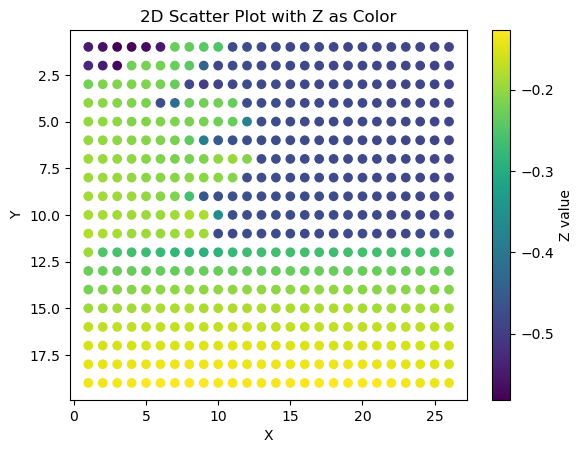

In [29]:
showDFplt(df)

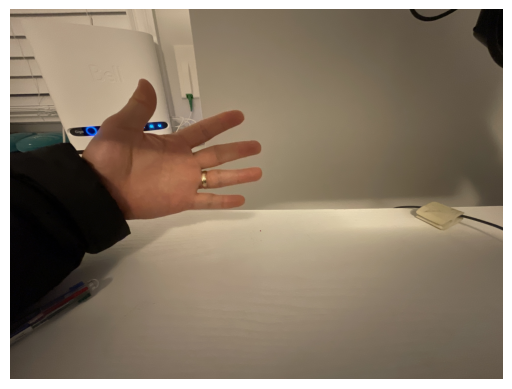

In [30]:
img = mpimg.imread('IMG_6219.jpg')  # Load image
plt.imshow(img)  # Display image
plt.axis('off')  # Hide axes
plt.show()

In [31]:
## So it seems that my guess was somewhat correct as the contour of my hands at least show up.

In [32]:
## Manually overlaying the Lidar Cloud Points to my hand reveals that the lidar sensor is relative

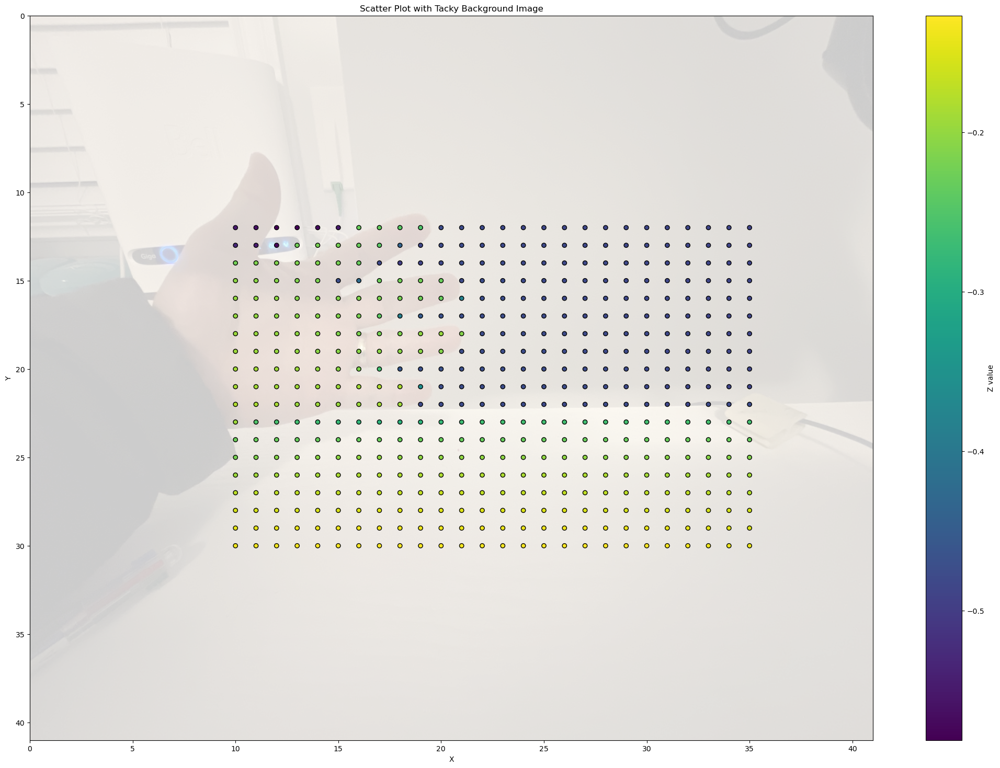

In [33]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load background img
background_img = mpimg.imread('IMG_V.jpg')
# Create the figure and axis
fig, ax = plt.subplots(figsize=(26, 18))



# Create the scatter plot on top of the background
scatter = ax.scatter(df['x']+9, df['y']+11, c=df['Z'], cmap='viridis', edgecolor='black')
# Show color legend
plt.colorbar(scatter, ax=ax, label='Z value')
# labels and title
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("Scatter Plot with Tacky Background Image")

# Display the background image
ax.imshow(background_img, aspect='auto', extent=[0, 41, 0, 41], alpha=0.2)  # Adjust alpha for transparency

# Option
ax.invert_yaxis()
ax.axis('on')  


plt.show()


## Next steps 
## 1. recreate situations where lidar struggles. E.g. a layer of glass with some water on it.
## 2. use CNN to map and label objects from photos
## 3. create labels for lidar
## 4. fuse labels and points from both photo and cloud point

## Test if I can separate edges of images without machine learning

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [35]:
def getGradientSeparated(img_address, vis = True, THRESHOLD = [150, 255]):
    # Load image
    image = cv2.imread(img_address)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # set threshold
    _, thresh = cv2.threshold(gray, THRESHOLD[0], THRESHOLD[1], cv2.THRESH_BINARY_INV)
    # Find contour
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # create blank image for labels
    labeled_image = np.zeros_like(image)
    
    # assign numeric labels
    for idx, cnt in enumerate(contours):
        cv2.drawContours(labeled_image, [cnt], -1, (idx+1, idx+1, idx+1), -1)  # Assign unique color
    
    
    
    # Convert BGR to RGB
    labeled_image_rgb = cv2.cvtColor(labeled_image, cv2.COLOR_BGR2RGB)

    # Display the img
    if (vis == True):        
        plt.figure(figsize=(8, 6))
        plt.imshow(labeled_image_rgb)
        plt.axis("off")
        plt.show()
        
    return labeled_image_rgb


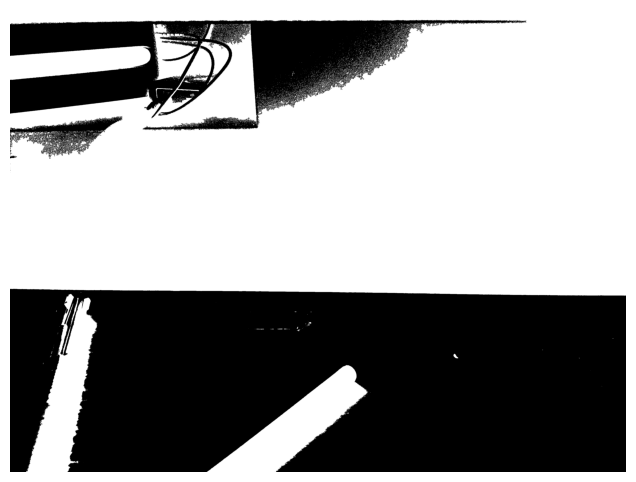

In [36]:
GS = getGradientSeparated('IMG_6216.jpg')

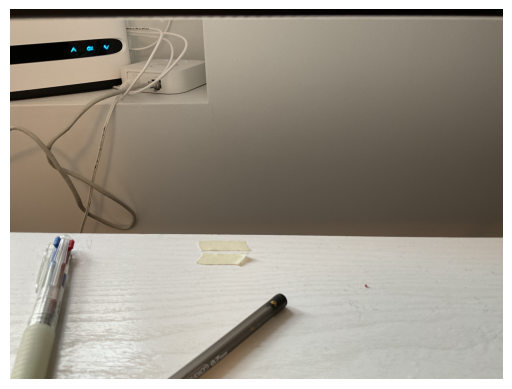

In [37]:
img = mpimg.imread('IMG_6216.jpg')
plt.imshow(img) 
plt.axis('off') 
plt.show()

In [38]:
pcd2 = o3d.io.read_point_cloud("./joint/j.ply")

In [39]:
xyz = np.asarray(pcd2.points)

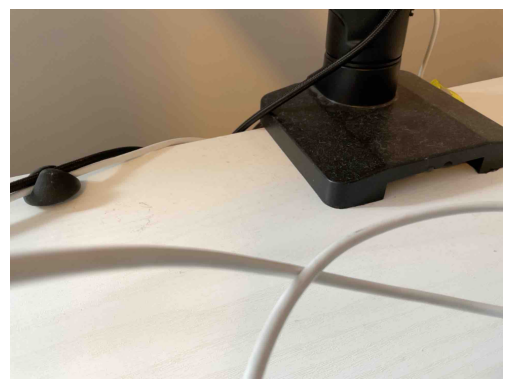

In [40]:
showImg("./joint/j.jpeg")

In [41]:
df2 = getDFfromPLY("./joint/j.ply")

In [42]:
df2.head(5)

,X,Y,Z,x,y
0,-0.223296,-0.128114,-0.399053,1,1
1,-0.207363,-0.128942,-0.402904,2,1
2,-0.191701,-0.130163,-0.408011,3,1
3,-0.175859,-0.131564,-0.413713,4,1
4,-0.159838,-0.133209,-0.420219,5,1


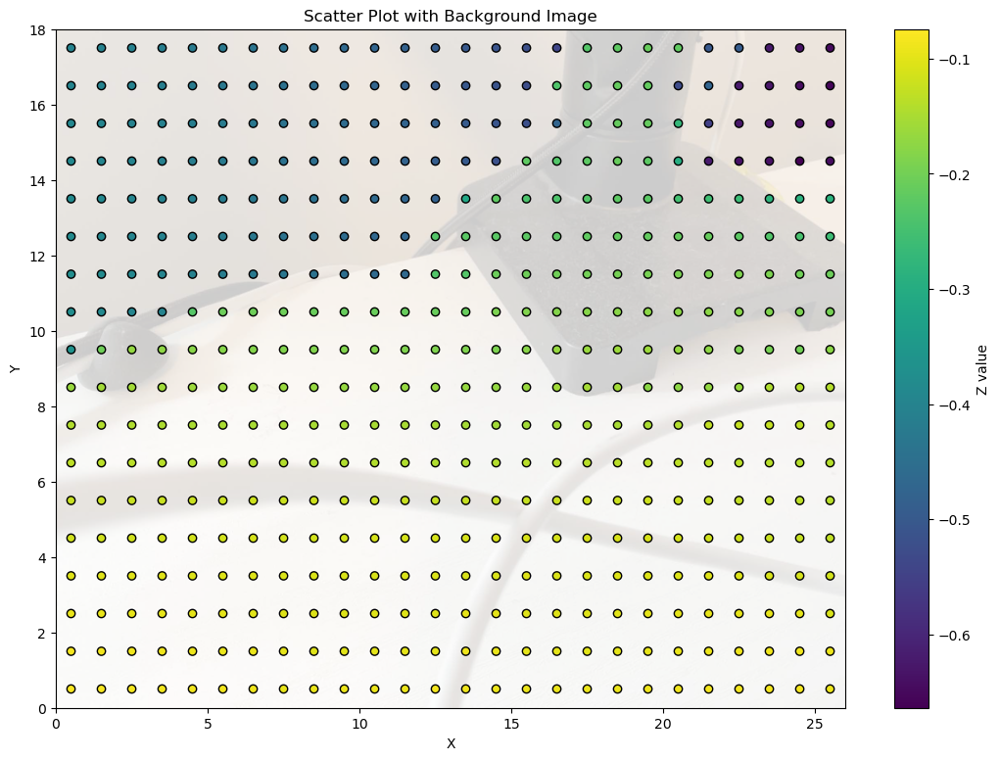

In [43]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Create the figure and axis
fig, ax = plt.subplots(figsize=(13, 9))

# Scatter plot; had to play around with the variables. 
#since the lidar points are divided into x,y grids, it has to be spot in the middle
# hence the -.5 in the x and y
# y coordinates had to be inverted because point cloud counts (left -> right ; up -> down), unlike a traditional graph
scatter = ax.scatter((df2['x']-.5), -(df2['y']-.5) + 18, c=df2['Z'], cmap='viridis', edgecolor='black')

# depth legend
plt.colorbar(scatter, ax=ax, label='Z value')

# Set labels and title
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_title("Scatter Plot with Background Image")



# load anddisplay image
background_img = mpimg.imread("./joint/j.jpeg")
ax.imshow(background_img, aspect='auto', extent=[0, 26, 0, 18], alpha=0.2)  # Adjust alpha for transparency

# option
# ax.invert_yaxis()

ax.axis('on')
plt.show()


In [44]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.patches as patches

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



car
car


IndexError: list index out of range

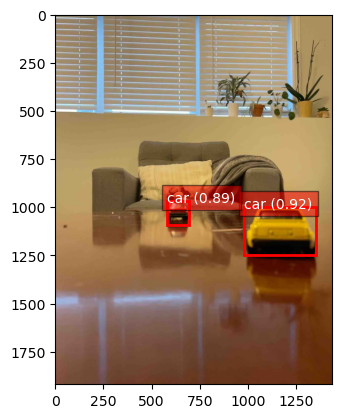

In [45]:
# COCO class labels (for 80 classes)
COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
    'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
    'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
    'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# Load R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set the model to evaluation mode
# load image
img = Image.open("./joint/small_cars.jpeg")
# process image
transform = transforms.Compose([transforms.ToTensor()])
img_tensor = transform(img)


# Make predictions
with torch.no_grad():
    prediction = model([img_tensor])

# Get the bounding boxes, labels, and scores
boxes = prediction[0]['boxes']
labels = prediction[0]['labels']
scores = prediction[0]['scores']

plt.imshow(img)
ax = plt.gca()


## Box and label Gen 
for i, box in enumerate(boxes):
    label = labels[i].item()
    score = scores[i].item()
    
    if ((score > 0.5) and (COCO_CLASSES[label] == "car")):
        # Get the coords of the bounding box
        x_min, y_min, x_max, y_max = box.tolist()
        
        #Add box
        ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none'))
        
        #Add labels
        label_name = COCO_CLASSES[label]  # Get the class name from the label
        ax.text(x_min, y_min, f'{label_name} ({score:.2f})', color='white', fontsize=10,
                bbox=dict(facecolor='red', alpha=0.5))
        print(label_name)

plt.show()


In [46]:
# pcd3 = o3d.io.read_point_cloud("./joint/small_cars.ply")
df3 = getDFfromPLY("./joint/small_cars.ply")

[Open3D WARNING] Read PLY failed: unable to read file: ./joint/small_cars.ply


RPly: Error reading 'green' of 'vertex' number 77


In [47]:
def showProjection(df, img, invert=False, z = -1):
    # Create the figure and axis
    fig, ax = plt.subplots(figsize=(13, 9))
    
    # Scatter plot; had to play around with the variables. 
    #since the lidar points are divided into x,y grids, it has to be spot in the middle
    # hence the -.5 in the x and y
    # y coordinates had to be inverted because point cloud counts (left -> right ; up -> down), unlike a traditional graph
    if (z == -1):
        scatter = ax.scatter((df['x']-.5), -(df['y']-.5) + 18, c=df['Z'], cmap='viridis', edgecolor='black')        
    else:
        scatter = ax.scatter((df['x']-.5), -(df['y']-.5) + 18, c=z, cmap='viridis', edgecolor='black')        
    
    # depth legend
    plt.colorbar(scatter, ax=ax, label='Z value')
    
    # labels
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_title("Scatter Plot with Background Image")
    
    
    
    # load anddisplay image
    background_img = mpimg.imread(img)
    ax.imshow(background_img, aspect='auto', extent=[0, 26, 0, 18], alpha=0.2)  # Adjust alpha for transparency

    if(invert == True):
        ax.invert_yaxis()
    
    ax.axis('on')
    plt.show()


## seems that small objects aren't read by my lidar...

In [48]:
df4 = getDFfromPLY("./joint/carr.ply")

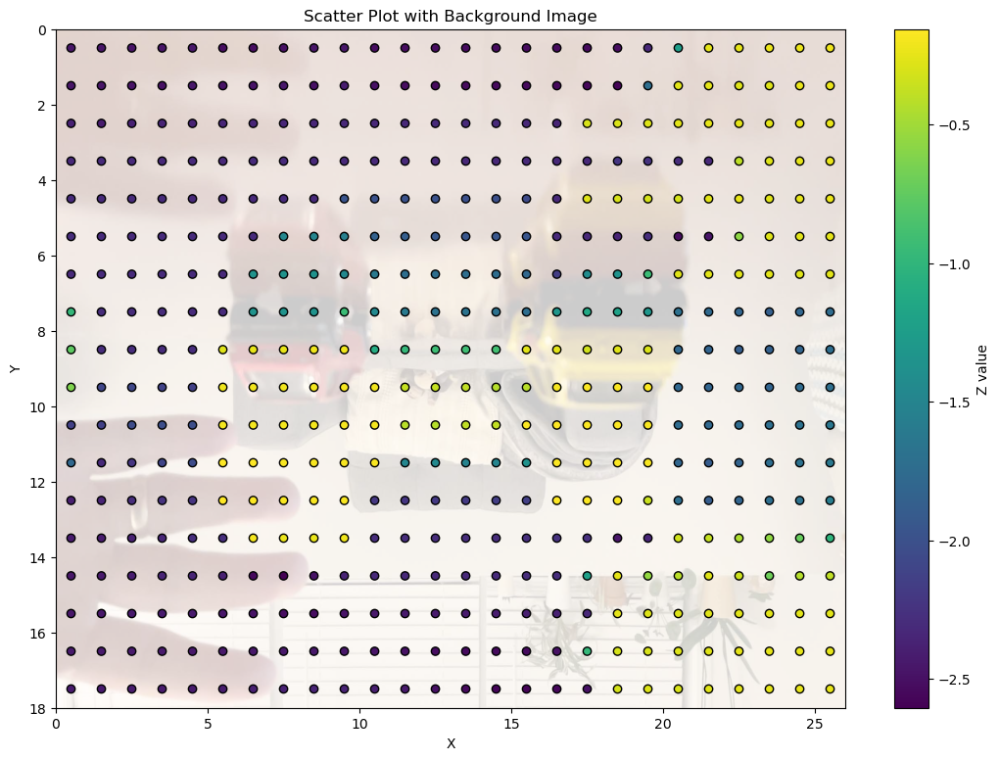

In [49]:
showProjection(df4, "./joint/carr.jpeg", True)

In [50]:
# COCO class labels (for 80 classes)
COCO_CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
    'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
    'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
    'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
    'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
    'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
    'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]


In [51]:

# Load R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()  # Set the model to evaluation mode

# load image
img = Image.open("./joint/carr.jpeg")
# process image
transform = transforms.Compose([transforms.ToTensor()])
img_tensor = transform(img)

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



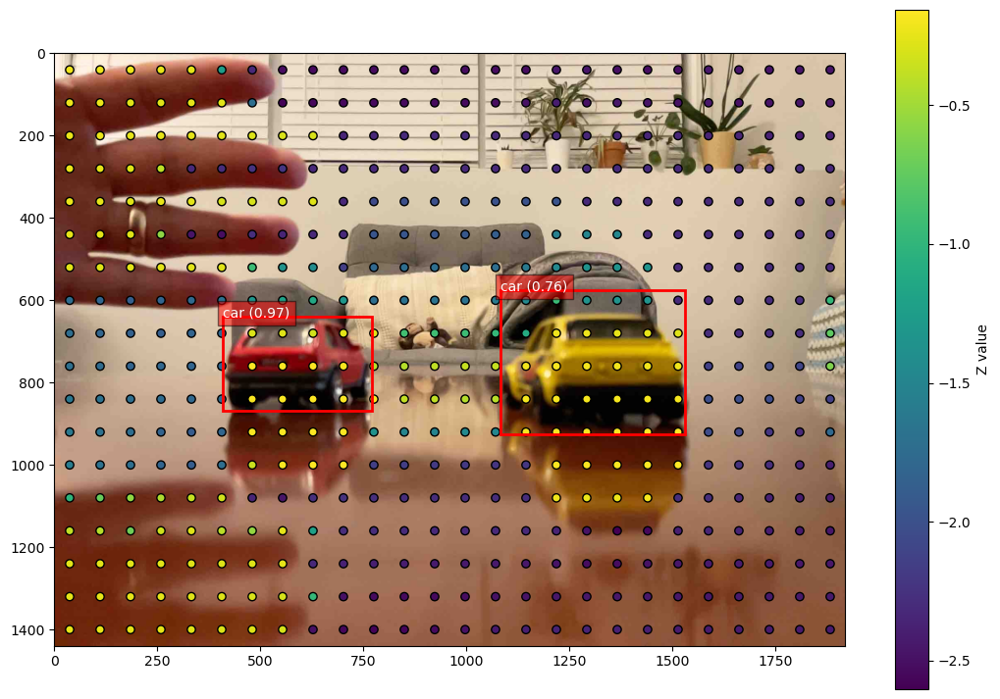

In [52]:
# Make predictions
with torch.no_grad():
    prediction = model([img_tensor])

# Get the bounding boxes, labels, and scores
boxes = prediction[0]['boxes']
labels = prediction[0]['labels']
scores = prediction[0]['scores']

# Display
fig, ax = plt.subplots(figsize=(13, 9))
scatter = ax.scatter( -((73.84*(df4['x']-.5))-1920), -(((df4['y']-.5)*80)-1440), c=df4['Z'], cmap='viridis', edgecolor='black')
plt.imshow(img)
# ax = plt.gca()


    
# depth legend
plt.colorbar(scatter, ax=ax, label='Z value')


## Box and label Gen 
for i, box in enumerate(boxes):
    label = labels[i].item()
    score = scores[i].item()
    
    if ((score > 0.5) and (COCO_CLASSES[label] == "car")):
        # Get the coords of the bounding box
        x_min, y_min, x_max, y_max = box.tolist()
        
        #Add box
        ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none'))
        
        #Add labels
        label_name = COCO_CLASSES[label]  # Get the class name from the label
        ax.text(x_min, y_min, f'{label_name} ({score:.2f})', color='white', fontsize=10,
                bbox=dict(facecolor='red', alpha=0.5))

plt.show()


In [53]:
## Let's streamline this

In [108]:
class RCNN:
    def __init__(self):
        self.model = model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()
        self.COCO_CLASSES = [
            'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
            'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
            'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
            'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
            'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
            'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']
        self.img_tensor = None
        self.img = None

    def loadImage(self, img_address):
        # load and process image
        self.img = Image.open(img_address)        
        TRANSFORM = transforms.Compose([transforms.ToTensor()])
        self.img_tensor = TRANSFORM(self.img)        


    ## Displays an overlay of 2 images
    ## img 1: mapping of lidar images
    ## img 2: RCNN prediction labels
    def display(self, df, hue = None, hueStyle = 'viridis'):
        # Make predictions
        with torch.no_grad():
            prediction = self.model([self.img_tensor])
    
        # Get the bounding boxes, labels, and scores
        boxes = prediction[0]['boxes']
        labels = prediction[0]['labels']
        scores = prediction[0]['scores']
        
        
        if (hue == None):
            hue = df['Z']
        else: 
            pass
        
        # Display
        fig, ax = plt.subplots(figsize=(13, 9))
        scatter = ax.scatter( -((73.84*(df['x']-.5))-1920), -(((df['y']-.5)*80)-1440), c=hue, cmap=hueStyle, edgecolor='black')
        # plt.imshow(self.img)
        ax.imshow(self.img)
        
        # ax.imshow(additional_layer_to_display, alpha=0.6)
        # ax = plt.gca()
        
        # depth legend
        plt.colorbar(scatter, ax=ax, label='Z value')
                
        ## Box and label Gen 
        for i, box in enumerate(boxes):
            label = labels[i].item()
            score = scores[i].item()
            
            if ((score > 0.5) and (COCO_CLASSES[label] == "car")):
                # Get the coords of the bounding box
                x_min, y_min, x_max, y_max = box.tolist()
                
                #Add box
                ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none'))
                
                #Add labels
                label_name = self.COCO_CLASSES[label]  # Get the class name from the label
                ax.text(x_min, y_min, f'{label_name} ({score:.2f})', color='white', fontsize=10,
                        bbox=dict(facecolor='red', alpha=0.5))
        
        plt.show()
    


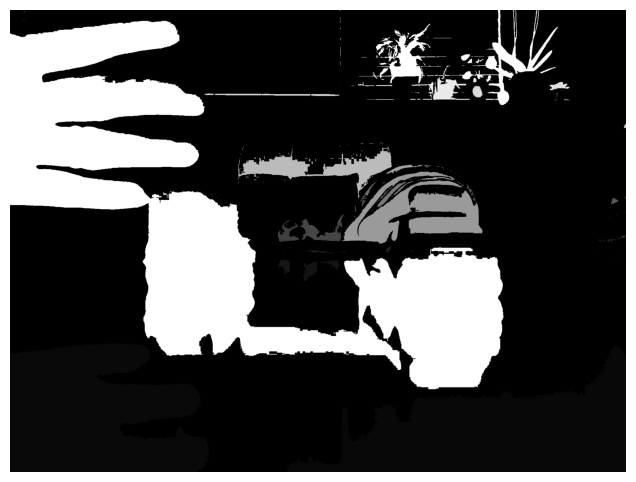

In [55]:
GS = getGradientSeparated("./joint/carr.jpeg", True, [110, 100])

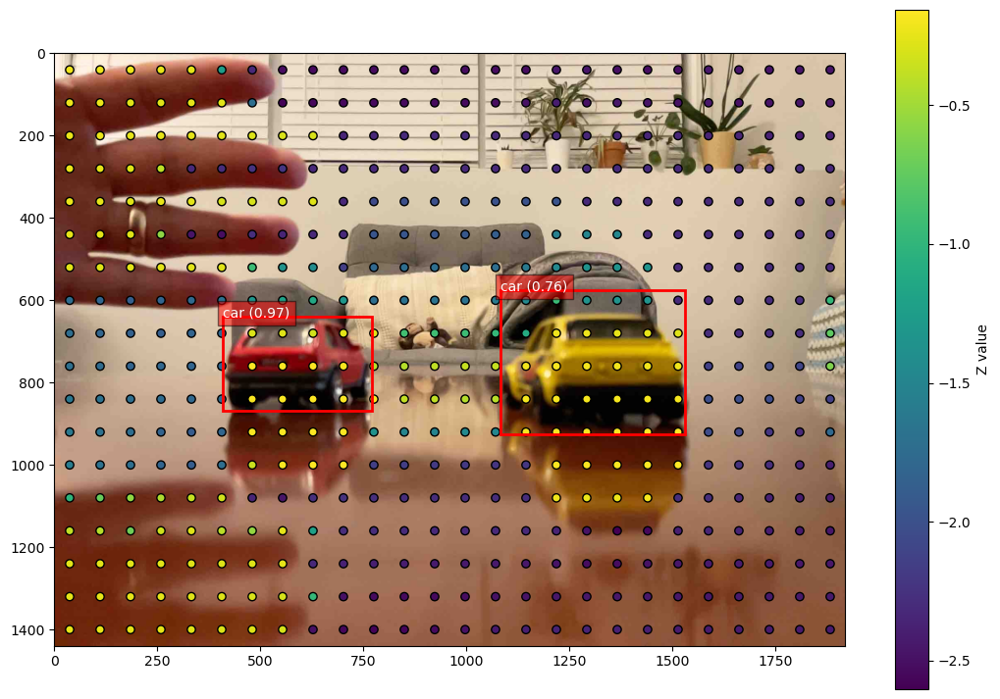

In [56]:
rcnn = RCNN()
rcnn.loadImage("./joint/carr.jpeg")
rcnn.display(df4)

## Currently, point cloud to image mapping is pretty trial-and-error. Can we make it more smart by incorporating 
## matrix multiplication?

In [57]:
# K = [fx 0 centerX]
#     [0 fy centerY]
#     [0 0  1]

# K = [[fx, 0, cx],[0, fy, cy],[0, 0, 1]]

fx = 1920
fy = 1440
cx = 960
cy = 720

K = [[fx, 0, cx],[0, fy, cy],[0, 0, 1]]
K = np.asarray(K)

In [58]:
K

array([[1920,    0,  960],
       [   0, 1440,  720],
       [   0,    0,    1]])

In [59]:
xyz_carr = getXyxFromPly("./joint/carr.ply")

In [60]:
xyz_carr_ = []
for item in xyz_carr:
    xyz_carr_.append((np.dot(K, item)).tolist())


In [61]:
xyz_carr_ = np.asarray(xyz_carr_)

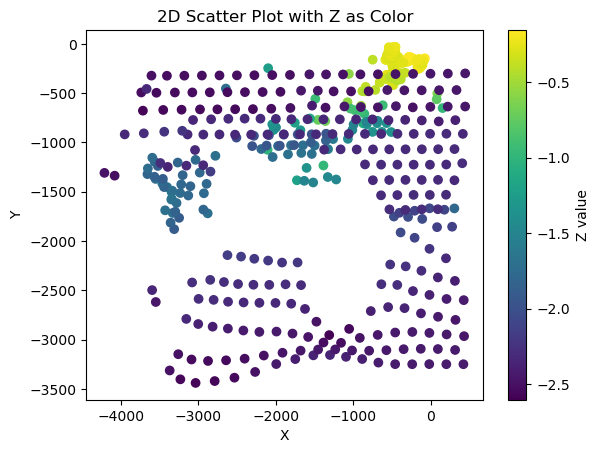

In [62]:
showPltScatter(xyz_carr_)

In [63]:
xyz

array([[-0.22329606, -0.12811376, -0.39905304],
       [-0.20736285, -0.12894174, -0.40290362],
       [-0.1917006 , -0.13016313, -0.4080106 ],
       ...,
       [ 0.07605023, -0.14385957, -0.07881606],
       [ 0.0834355 , -0.14443704, -0.07930557],
       [ 0.09176971, -0.1464206 , -0.08056451]])

[[1920    0  300]
 [   0 2000    1]
 [   0    0    1]]
[[ 1.431306   -1.0451314  -2.4230647 ]
 [ 1.3170483  -1.0444955  -2.4242933 ]
 [ 1.2024947  -1.043536   -2.4247677 ]
 ...
 [-0.12493279  0.09209823 -0.22788513]
 [-0.13664168  0.09309629 -0.23045906]
 [-0.15724663  0.10039848 -0.24843594]]


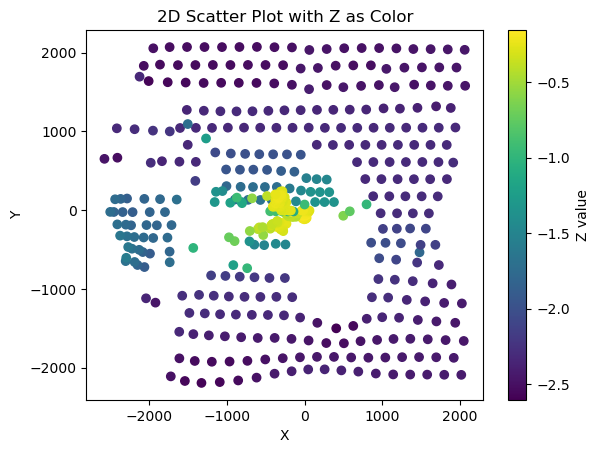

In [64]:
# K = [fx 0 centerX]
#     [0 fy centerY]
#     [0 0  1]

# K = [[fx, 0, cx],[0, fy, cy],[0, 0, 1]]

fx = 1920
fy = 2000
cx = 300
cy = 1

K = [[fx, 0, cx],[0, fy, cy],[0, 0, 1]]
K = np.asarray(K)
print(K)

xyz_carr = getXyxFromPly("./joint/carr.ply")
xyz_carr_ = []
print(xyz_carr)
for item in xyz_carr:
    xyz_carr_.append((np.dot(K, item)).tolist())
xyz_carr_ = np.asarray(xyz_carr_)
showPltScatter(xyz_carr_)

## I gave it a try, but it involves making an app to extract camera intrinsics, image plane, sensor data, camera, and world data.

## The method I am currently using does the same thing, but without the rigorous math.


In [65]:
## New task  Make detection visualization 


In [66]:
# import laspy
# import rasterio
# import alphashape as ash
# import shapely as sh

In [67]:
# from rasterio.transform import from_origin
# from rasterio.enums import Resampling
# from rasterio.features import shapes
# from shapely.geometry import Polygon

In [68]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler



In [69]:
def show3D(plyFileAddress):
    # Load a point cloud (replace with your own point cloud data)
    pcd = o3d.io.read_point_cloud(plyFileAddress)
    points = np.asarray(pcd.points)

    # Standardize the data
    scaler = StandardScaler()
    points_scaled = scaler.fit_transform(points)

    # Apply DBSCAN
    db = DBSCAN(eps=0.3, min_samples=10)
    labels = db.fit_predict(points_scaled)

    # Assign labels to the point cloud
    colors = plt.cm.viridis(labels / (labels.max() if labels.max() != 0 else 1))
    pcd.colors = o3d.utility.Vector3dVector(colors[:, :3])

    # Visualize the clustered point cloud
    o3d.visualization.draw_geometries([pcd])

In [70]:
show3D("./joint/carr.ply")

2025-04-07 22:43:20.599 python[14887:9591620] +[IMKClient subclass]: chose IMKClient_Modern
2025-04-07 22:43:20.599 python[14887:9591620] +[IMKInputSession subclass]: chose IMKInputSession_Modern
2025-04-07 22:43:20.632 python[14887:9591620] TSM AdjustCapsLockLEDForKeyTransitionHandling - _ISSetPhysicalKeyboardCapsLockLED Inhibit


## Inspecting the 3d representation above, one can see that even the reflection of a wood finish is causing a lot of noise

In [71]:
xyz = getXyxFromPly("./joint/carr.ply")

In [72]:
## 2nd method of clustering labels with machine learning
from sklearn.cluster import KMeans
X_train = xyz
kmeans = KMeans(n_clusters=10)  # adjust to change mean (of the center)
kmeans.fit(X_train)
cluster_labels1 = kmeans.labels_

In [73]:
cluster_labels1 =  cluster_labels1.tolist()

In [74]:
## 2nd method of clustering labels with machine learning
## This cluster promises noise filtering (min_sample > will be considered noise)
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.05, min_samples=3)
cluster_labels2 = db.fit_predict(X_train)

In [75]:
cluster_labels2 = cluster_labels2.tolist()

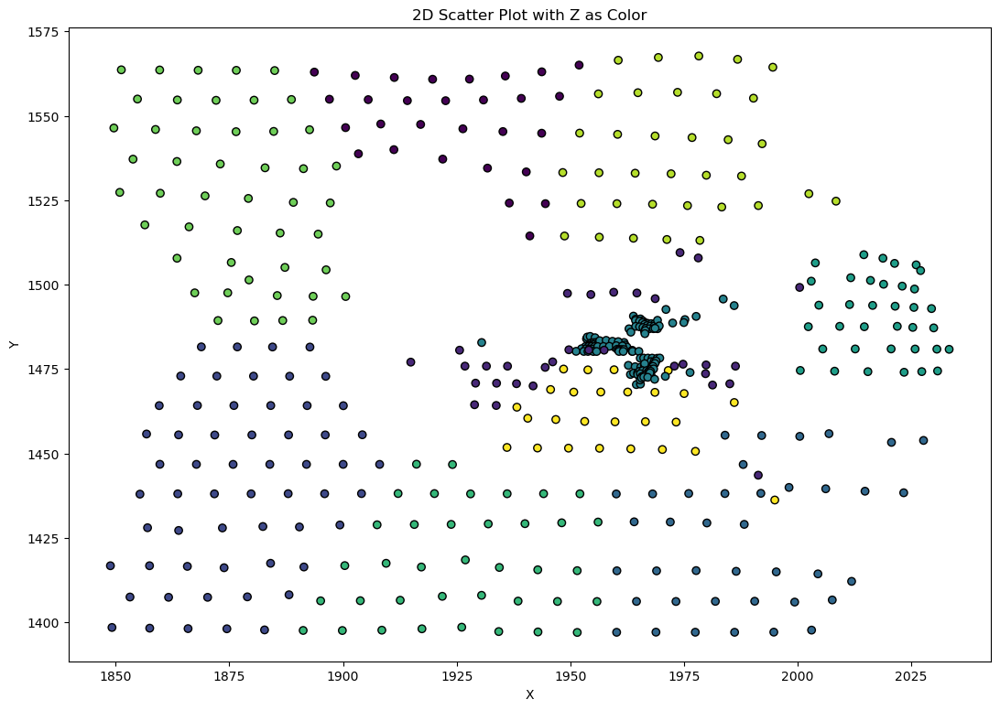

In [76]:
x = xyz[:, 0]  # X-coordinates
y = xyz[:, 1]  # Y-coordinates
# z = xyz[:, 2]  # color
z = cluster_labels1

fig, ax = plt.subplots(figsize=(13, 9))
scatter = ax.scatter( -((73.84*(x-.5))-1920), -(((y-.5)*80)-1440), c=z, cmap='viridis', edgecolor='black')

# Create scatter plot
# plt.scatter(x, y, c=z, cmap='viridis')
# plt.colorbar(label='Z value')  # color legend
plt.xlabel("X")
plt.ylabel("Y")
plt.title("2D Scatter Plot with Z as Color")

plt.show()


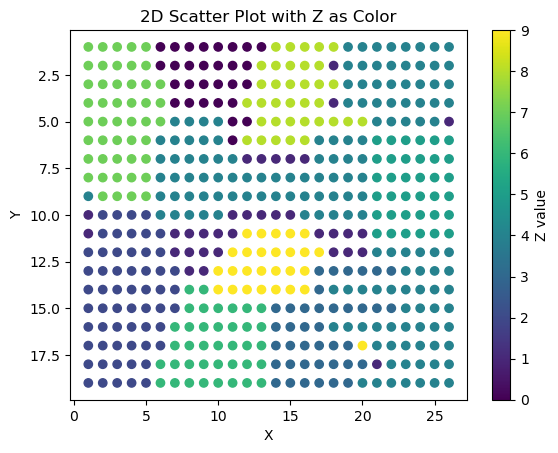

In [77]:
df = getDFfromPLY("./joint/carr.ply")
showDFplt(df, cluster_labels1)

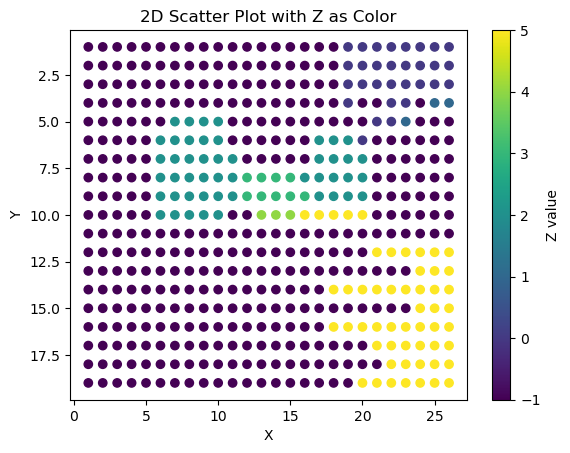

In [78]:
showDFplt(df, cluster_labels2)

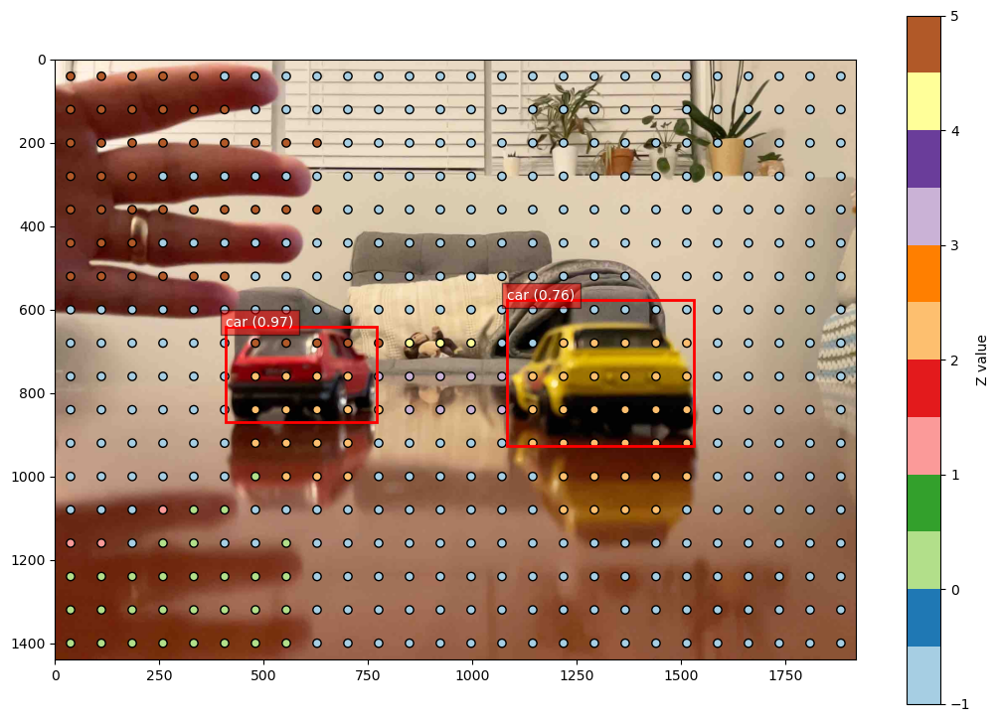

In [79]:
rcnn.display(df4, cluster_labels2, hueStyle = 'Paired')

## Since clustering cloud points is successful
## cluster_labels2 has -1 label which is the label of noise (noise filter)
## Let's update the display/projection such that only objects closer than 0.5 meters and non-noise clusters are shown. 

In [80]:
print(set(cluster_labels2))

{0, 1, 2, 3, 4, 5, -1}


In [125]:
class RCNN:
    def __init__(self):
        self.model = model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
        self.model.eval()
        self.COCO_CLASSES = [
            'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat',
            'traffic light', 'fire hydrant', 'N/A', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
            'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack', 'umbrella', 'N/A', 'handbag', 'tie',
            'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard',
            'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana',
            'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant',
            'bed', 'N/A', 'dining table', 'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone',
            'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
            'toothbrush']
        self.img_tensor = None
        self.img = None

    def loadImage(self, img_address):
        # load and process image
        self.img = Image.open(img_address)        
        transform = transforms.Compose([transforms.ToTensor()])
        self.img_tensor = transform(self.img)        

    ## Displays an overlay of 2 images
    ## img 1: mapping of lidar images
    ## img 2: RCNN prediction labels
    def display(self, DF, hue = None, hueStyle = 'viridis', uniqueCluster=False):
        df = DF.copy()
        # print(df.head(3))
        # Make predictions
        with torch.no_grad():
            prediction = self.model([self.img_tensor])
    
        # Get the bounding boxes, labels, and scores
        boxes = prediction[0]['boxes']
        labels = prediction[0]['labels']
        scores = prediction[0]['scores']
        
        # print("df", df)
        # print("hue", hue)
        ## Add special hue if instructed        
        if (hue is None):
            hue = df['Z']
        else: 
            df_copy = df

            ##filter objects farther than .5 meters
            ##filter objects that are noise
            for i in range(len(hue)):
                if (hue[i] == -1) or (DF.iloc[i]['Z'] < -0.5):
                    df_copy.loc[i, 'x'] = np.nan= np.nan  # Set the entire row to NaN
                    df_copy.loc[i, 'y'] = np.nan= np.nan
                    ## if pram is given, hue is based on unique clusters
                    if (uniqueCluster == True):
                        df_copy.loc[i, 'Z'] = hue[i]
                        
            df = df_copy
            
            
            

        # Display
        fig, ax = plt.subplots(figsize=(13, 9))
        ## Different hueStyle options viridis, Greys, bwr, tab20
        ## tab20 recommended for unique clusters
        scatter = ax.scatter( -((73.84*(df['x']-.5))-1920), -(((df['y']-.5)*80)-1440), c=df['Z'], cmap=hueStyle, edgecolor='black')
        # plt.imshow(self.img)
        ax.imshow(self.img)
        
        # ax.imshow(additional_layer_to_display, alpha=0.6)
        # ax = plt.gca()
        
        # depth legend
        plt.colorbar(scatter, ax=ax, label='Z value')
                
        ## Box and label Gen 
        for i, box in enumerate(boxes):
            label = labels[i].item()
            score = scores[i].item()
            
            if ((score > 0.5) and (COCO_CLASSES[label] == "car")):
                # Get the coords of the bounding box
                x_min, y_min, x_max, y_max = box.tolist()
                
                #Add box
                ax.add_patch(patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=2, edgecolor='r', facecolor='none'))
                
                #Add labels
                label_name = self.COCO_CLASSES[label]  # Get the class name from the label
                ax.text(x_min, y_min, f'{label_name} ({score:.2f})', color='white', fontsize=10,
                        bbox=dict(facecolor='red', alpha=0.5))
        
        plt.show()
    


In [82]:
df4 = getDFfromPLY("./joint/carr.ply")

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



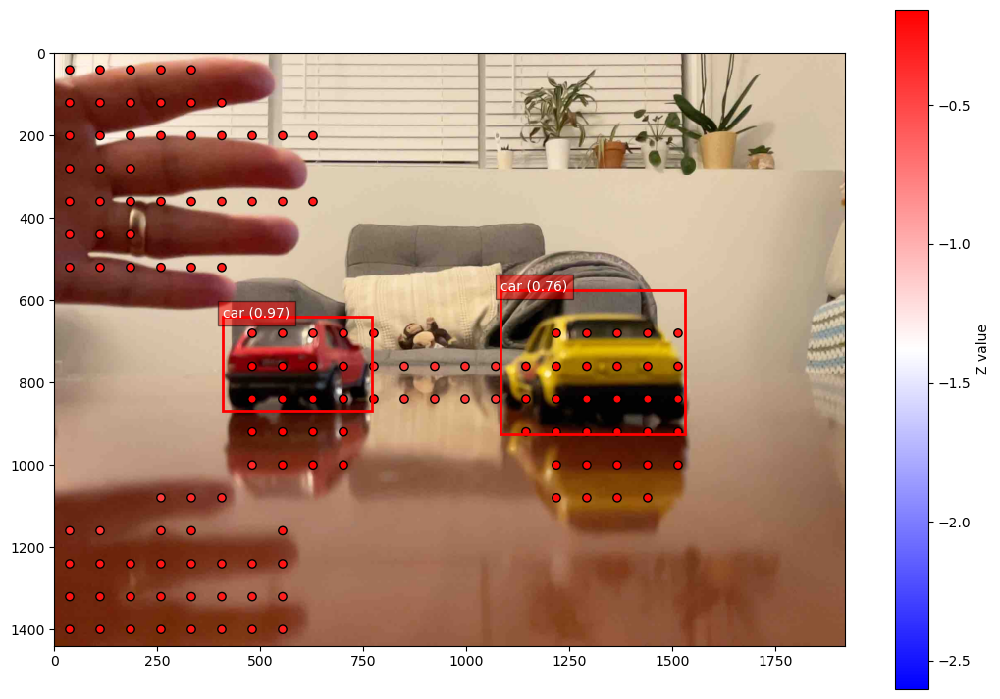

In [83]:
## Showing distance
## Anything less than 50cm is set to be shown.

rcnn = RCNN()
rcnn.loadImage("./joint/carr.jpeg")
rcnn.display(df4, cluster_labels2, hueStyle = 'bwr', uniqueCluster=False)

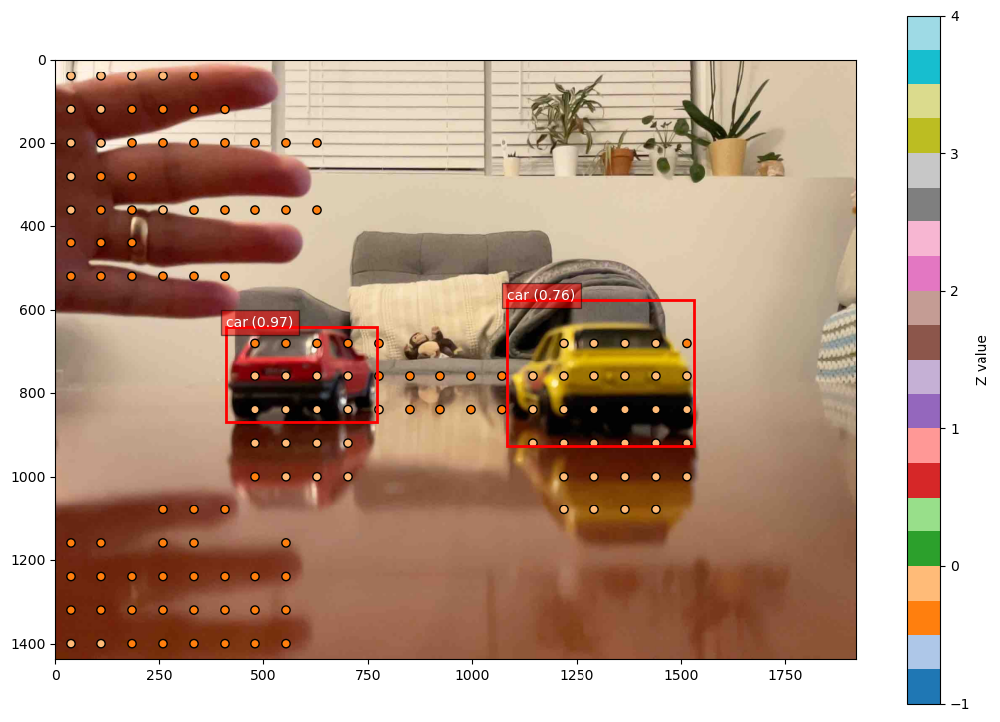

In [84]:
## Comparing unique clusters
rcnn.display(df4, cluster_labels2, hueStyle = 'tab20', uniqueCluster=True)

## The image above dots are things that are closer than 50cm. However, you can see that the surface doesn't count as close. It's because surface reflection is causing issues with the lidar, making it seem like the surface and the wall are at the same distance.

## New info: Apple's 940 nm wavelength might be a really bad option of lidar for wet surfaces or just in general.

## Now the final test/Scenario: Wet lens cover or windshield (in front of the LiDAR)

In [126]:
xyz = getXyxFromPly("./joint/boat.ply")
X_train = xyz
## 2nd method of clustering labels with machine learning
## This cluster promises noise filtering (min_sample > will be considered noise)
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.05, min_samples=3)
cluster_labels = db.fit_predict(X_train)

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/Users/danieljoh/anaconda3/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.



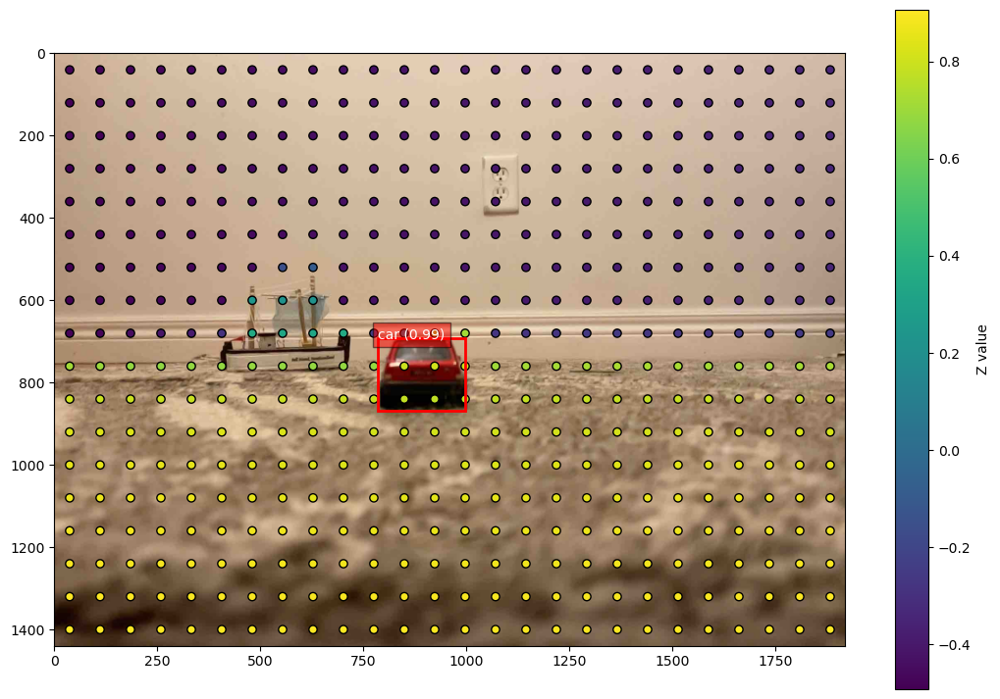

In [127]:
df = getDFfromPLY("./joint/boat.ply")
rcnn2 = RCNN()
rcnn2.loadImage("./joint/boat.jpeg")
rcnn2.display(df)

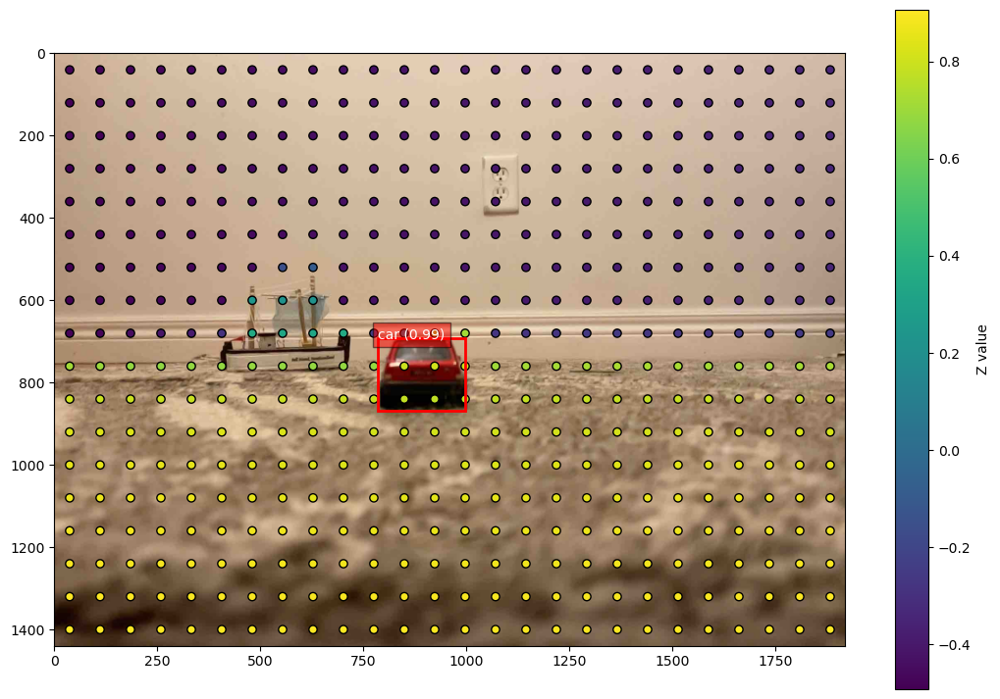

In [128]:
df = getDFfromPLY("./joint/boat.ply")
rcnn2.display(df)

In [129]:
rcnn2.display?

Signature: rcnn2.display(DF, hue=None, hueStyle='viridis', uniqueCluster=False)
Docstring: <no docstring>
File:      /var/folders/7n/05f5jrgn1t111ckyjnlbnnj80000gn/T/ipykernel_14887/1333529985.py
Type:      method

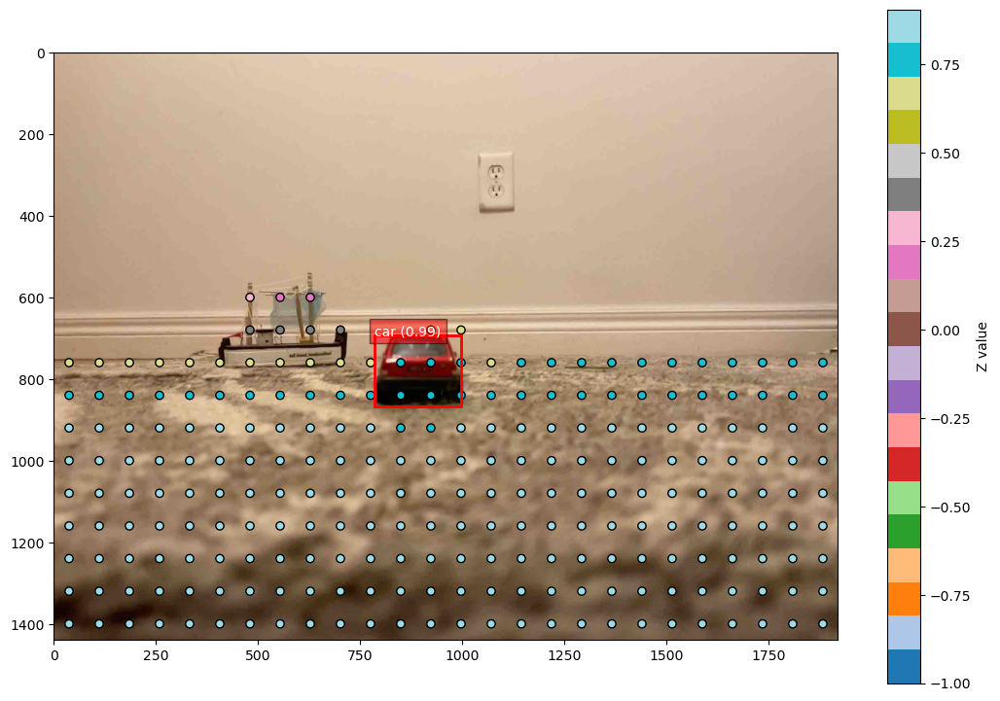

In [131]:
rcnn2.display(df, cluster_labels, hueStyle='tab20', uniqueCluster=True)